In [14]:
import infercnvpy as cnv
import numpy as np
import pandas as pd
import scanpy as sc
import scanpy.external as sce
import scipy
sc.settings.verbosity = 3
sc.logging.print_header()
sc.set_figure_params(dpi=100, dpi_save=600)

import matplotlib.pyplot as pl
from matplotlib import rcParams

import os

scanpy==1.9.3 anndata==0.9.1 umap==0.5.3 numpy==1.24.4 scipy==1.11.1 pandas==2.0.3 scikit-learn==1.3.0 statsmodels==0.14.0 python-igraph==0.10.5 pynndescent==0.5.10


In [2]:
raw = sc.read('/mnt/g/YS-work/2.Scanpy/YS_All_raw.h5ad')
raw

AnnData object with n_obs × n_vars = 190763 × 36601
    obs: 'predicted_doublets', 'batch'
    var: 'gene_ids'

In [15]:
processed = sc.read('/mnt/g/YS-work/2.Scanpy/YS_All_afterumap.h5ad')
processed

AnnData object with n_obs × n_vars = 166180 × 5000
    obs: 'predicted_doublets', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'leiden', 'Metastases'
    var: 'gene_ids', 'n_cells', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Metastases_colors', 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


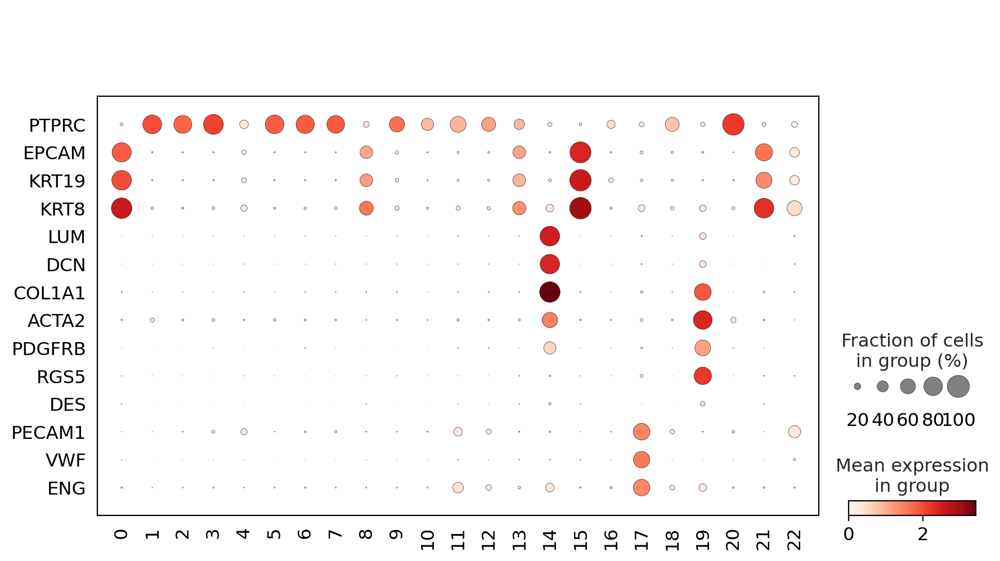

In [16]:
markers=['PTPRC','EPCAM','KRT19','KRT8','LUM','DCN','COL1A1','ACTA2','PDGFRB','RGS5','DES','PECAM1', 'VWF','ENG']
sc.pl.dotplot(processed, var_names=markers, groupby='leiden', use_raw=True, var_group_rotation=0, vmin=0, swap_axes=True, dot_min=0,save='all_1.pdf')

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


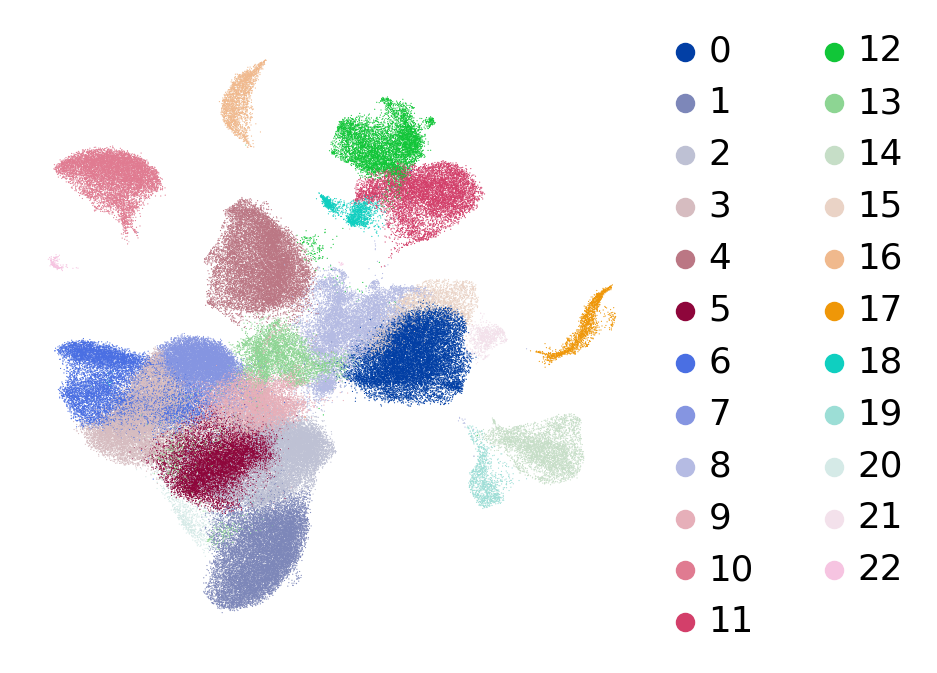

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


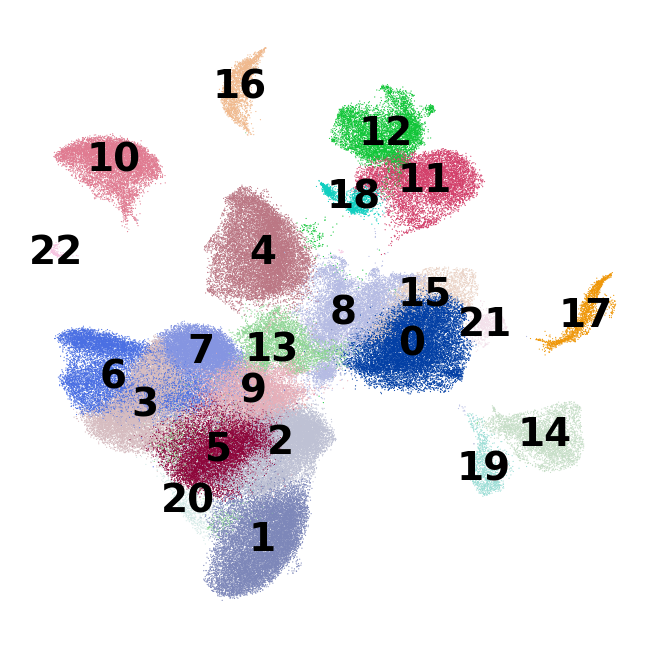

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


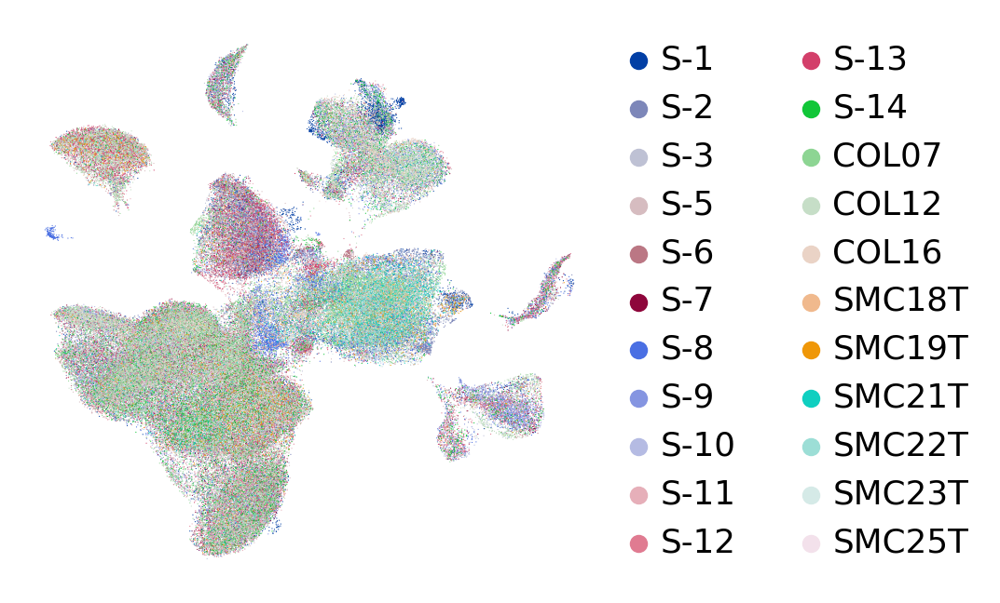

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


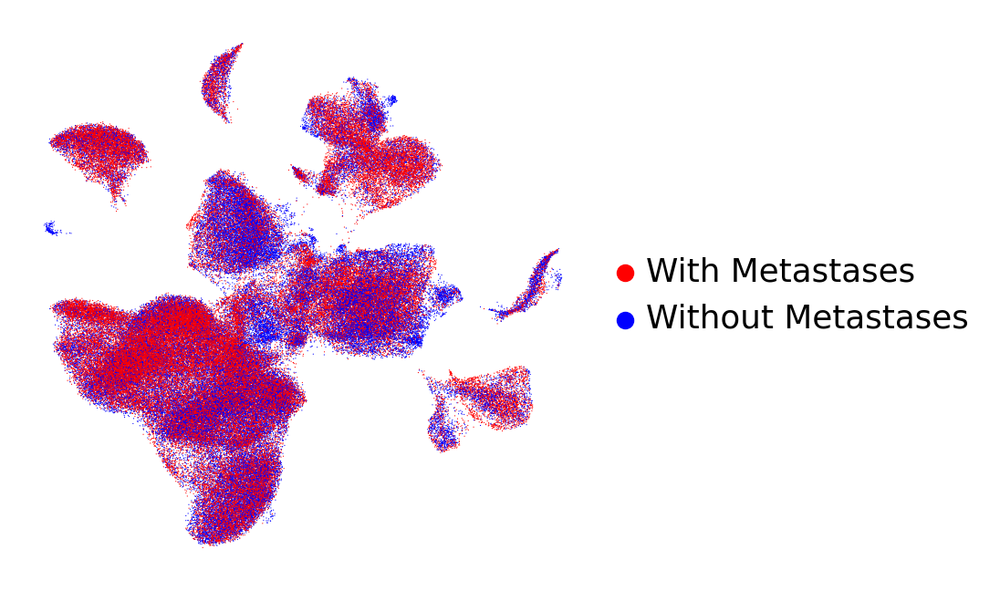

In [8]:
sc.pl.umap(processed, color=['leiden'], legend_loc='right margin', frameon=False, title='', use_raw=True, save='all_1.pdf')
sc.pl.umap(processed, color=['leiden'], legend_loc='on data', frameon=False, title='', use_raw=True)
sc.pl.umap(processed, color=['batch'], legend_loc='right margin', frameon=False, title='', use_raw=True, save='all_2.pdf')
sc.pl.umap(processed, color=['Metastases'], legend_loc='right margin', frameon=False, title='', use_raw=True, palette={'Without Metastases': 'blue', 'With Metastases': 'red'}, save='all_3.pdf')

In [5]:
flatten = lambda nest_list: sum(([x] if not isinstance(x, list) else flatten(x) for x in nest_list), [])
def label_helper(number_of_cluster: int):
  _s1 = ",\n".join([str(i) for i in range(number_of_cluster+1)])
  _s2 = "\nnew_cluster_names ='''\n" + _s1 + ",\n'''\n"
  print(_s2)
def labeled(
  adata: sc.AnnData, 
  cluster_names: str, 
  reference_key: str, 
  cell_type_key: str = 'CellType', 
  inplace: bool = True
  ):
  _adata = adata if inplace else adata.copy()
  _ref_df = _adata.obs.loc[:, [reference_key]]
  _annot_df = pd.read_csv(StringIO(cluster_names), header=None, dtype='object')
  _adata.obs[cell_type_key] = pd.merge(
    _ref_df, _annot_df, left_on=reference_key, right_on=0, how='left')[1].values
  return None if inplace else _adata

In [9]:
label_helper(22)
new_cluster_names ='''
0,Epi
1,
2,
3,
4,
5,
6,
7,
8,Epi
9,
10,
11,
12,
13,Epi
14,Stromal
15,Epi
16,
17,Stromal
18,
19,Stromal
20,
21,Epi
22,Epi
'''


new_cluster_names ='''
0,
1,
2,
3,
4,
5,
6,
7,
8,
9,
10,
11,
12,
13,
14,
15,
16,
17,
18,
19,
20,
21,
22,
'''



... storing 'CellType' as categorical


/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


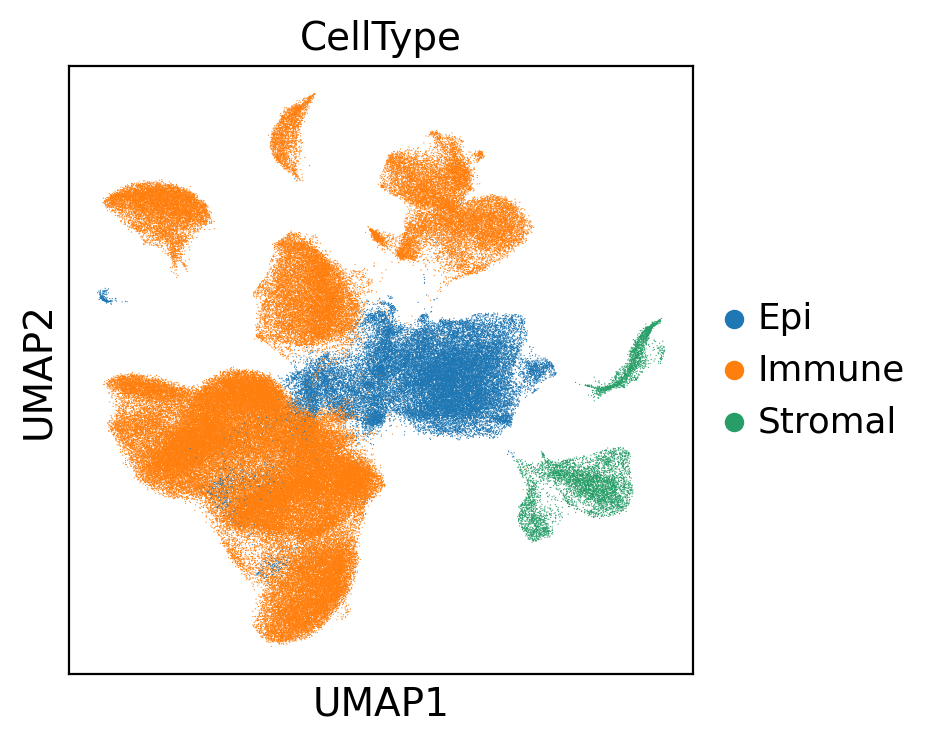

In [10]:
from io import StringIO
labeled(processed,cluster_names=new_cluster_names,reference_key='leiden',cell_type_key='CellType')
processed.obs.CellType.fillna('Immune',inplace=True)
sc.pl.umap(processed,color='CellType',save='celltype.pdf')

In [11]:
import scanpy as sc

# Extract the indices of the cells in the raw AnnData object
cell_indices = processed.obs_names

# Subset the raw AnnData object using the extracted cell indices
adata = raw[cell_indices]

# Print the information of the new AnnData object
print(adata)

View of AnnData object with n_obs × n_vars = 166180 × 36601
    obs: 'predicted_doublets', 'batch'
    var: 'gene_ids'


In [12]:
processed

AnnData object with n_obs × n_vars = 166180 × 5000
    obs: 'predicted_doublets', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'leiden', 'Metastases', 'CellType'
    var: 'gene_ids', 'n_cells', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Metastases_colors', 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap', 'CellType_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [13]:
adata.uns['leiden_colors']=processed.uns['leiden_colors']
adata.uns['Metastases_colors']=processed.uns['Metastases_colors']
adata.uns['batch_colors']=processed.uns['batch_colors']
adata.obsm['X_umap']=processed.obsm['X_umap']
adata

/tmp/ipykernel_22511/1260713729.py:1: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['leiden_colors']=processed.uns['leiden_colors']


AnnData object with n_obs × n_vars = 166180 × 36601
    obs: 'predicted_doublets', 'batch'
    var: 'gene_ids'
    uns: 'leiden_colors', 'Metastases_colors', 'batch_colors'
    obsm: 'X_umap'

In [14]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')
adata.var['rp'] = adata.var_names.str.startswith('RPL') | adata.var_names.str.startswith('RPS')
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt','rp'], percent_top=None, log1p=False, inplace=True)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)


normalizing counts per cell
    finished (0:00:01)


In [15]:
metastases_status = {
    'S-1': 'Without Metastases',
    'S-2': 'Without Metastases',
    'S-3': 'With Metastases',
    'S-5': 'With Metastases',
    'S-6': 'Without Metastases',
    'S-7': 'With Metastases',
    'S-8': 'Without Metastases',
    'S-9': 'With Metastases',
    'S-10': 'With Metastases',
    'S-11': 'Without Metastases',
    'S-12': 'Without Metastases',
    'S-13': 'With Metastases',
    'S-14': 'Without Metastases',
    'COL07': 'With Metastases',
    'COL12': 'With Metastases',
    'COL16': 'With Metastases',
    'SMC18T': 'Without Metastases',
    'SMC19T': 'Without Metastases',
    'SMC21T': 'With Metastases',
    'SMC22T': 'Without Metastases',
    'SMC23T': 'Without Metastases',
    'SMC25T': 'With Metastases',
}
adata.obs['Metastases'] = adata.obs['batch'].map(metastases_status)

In [23]:
adata.var.to_csv("gene_infor.csv")

In [24]:
df = pd.read_csv('gene_infor_loc.csv')

#加入基因染色体信息
adata.var['chromosome'] = df['chr'].to_list()
adata.var['start'] = df['start'].to_list()
adata.var['end'] = df['end'].to_list()
#检查基因信息 染色体和基因位置
adata.var

#去掉NA
adata = adata[: , adata.var.chromosome.notna()]
#再检查基因信息 染色体和基因位置
adata.var

,gene_ids,mt,rp,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,chromosome,start,end
MIR1302-2HG,MIR1302-2HG,False,False,9,0.000054,99.994584,9.0,chr1,29554.0,31109.0
FAM138A,FAM138A,False,False,0,0.000000,100.000000,0.0,chr1,34554.0,36081.0
OR4F5,OR4F5,False,False,0,0.000000,100.000000,0.0,chr1,65419.0,71585.0
AL627309.1,AL627309.1,False,False,250,0.001565,99.849561,260.0,chr1,89295.0,133723.0
AL627309.3,AL627309.3,False,False,1,0.000006,99.999398,1.0,chr1,89551.0,91105.0
...,...,...,...,...,...,...,...,...,...,...
MT-ND4L,MT-ND4L,True,False,64725,1.356962,61.051270,225500.0,chrM,10470.0,10766.0
MT-ND4,MT-ND4,True,False,151575,33.547497,8.788663,5574923.0,chrM,10760.0,12137.0
MT-ND5,MT-ND5,True,False,110426,4.620399,33.550367,767818.0,chrM,12337.0,14148.0
MT-ND6,MT-ND6,True,False,17676,0.151294,89.363341,25142.0,chrM,14149.0,14673.0


In [26]:
adata

View of AnnData object with n_obs × n_vars = 166180 × 36117
    obs: 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'Metastases'
    var: 'gene_ids', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'chromosome', 'start', 'end'
    uns: 'leiden_colors', 'Metastases_colors', 'batch_colors', 'log1p'
    obsm: 'X_umap'

In [27]:
adata.obs['CellType']=processed.obs['CellType']

/tmp/ipykernel_22511/1806541719.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['CellType']=processed.obs['CellType']


In [28]:
adata.obs['CellType']

AAACCTGAGAAGAAGC-1-S-1        Immune
AAACCTGAGCCGTCGT-1-S-1           Epi
AAACCTGAGCTTCGCG-1-S-1        Immune
AAACCTGAGGGTATCG-1-S-1        Immune
AAACCTGAGGGTGTTG-1-S-1           Epi
                              ...   
TTTGTCAAGCGCTCCA-1-SMC25T     Immune
TTTGTCAAGCGTTCCG-1-SMC25T     Immune
TTTGTCAAGTTCGATC-1-SMC25T    Stromal
TTTGTCACAAATACAG-1-SMC25T     Immune
TTTGTCATCCCAAGTA-1-SMC25T        Epi
Name: CellType, Length: 166180, dtype: category
Categories (3, object): ['Epi', 'Immune', 'Stromal']

In [25]:
adata.var.loc[:, ["chromosome", "start", "end"]].head()

,chromosome,start,end
MIR1302-2HG,chr1,29554.0,31109.0
FAM138A,chr1,34554.0,36081.0
OR4F5,chr1,65419.0,71585.0
AL627309.1,chr1,89295.0,133723.0
AL627309.3,chr1,89551.0,91105.0


In [29]:
cnv.tl.infercnv(adata, reference_key='CellType', reference_cat='Stromal', window_size =250, step = 10, exclude_chromosomes={'chrMT'}, n_jobs=32)
adata

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [01:26<00:00,  2.53s/it]


AnnData object with n_obs × n_vars = 166180 × 36117
    obs: 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'Metastases', 'CellType'
    var: 'gene_ids', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'chromosome', 'start', 'end'
    uns: 'leiden_colors', 'Metastases_colors', 'batch_colors', 'log1p', 'cnv'
    obsm: 'X_umap', 'X_cnv'

... storing 'Metastases' as categorical


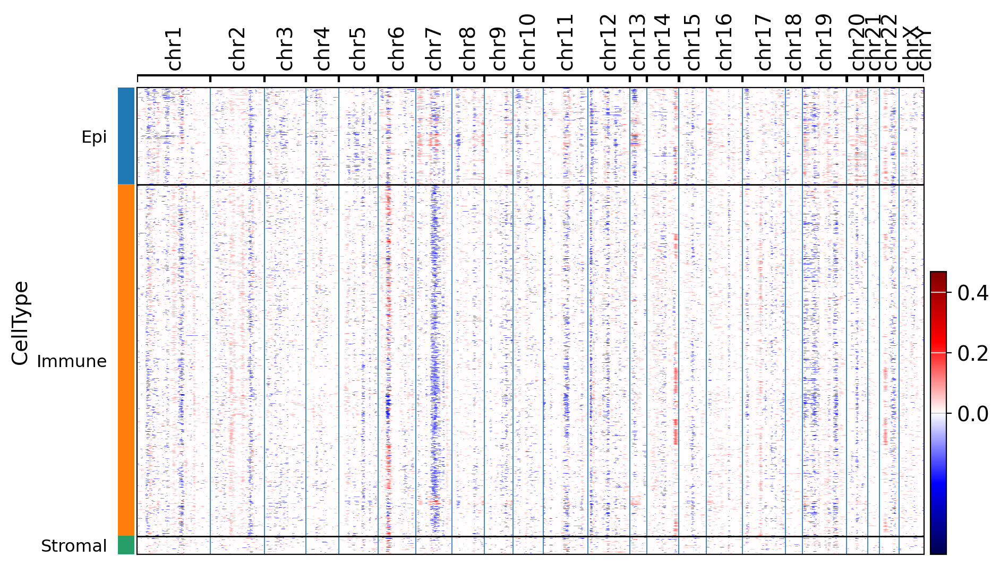

... storing 'Metastases' as categorical


         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:52)
Storing dendrogram info using `.uns['dendrogram_batch']`
categories: S-1, S-2, S-3, etc.
var_group_labels: chr1, chr2, chr3, etc.


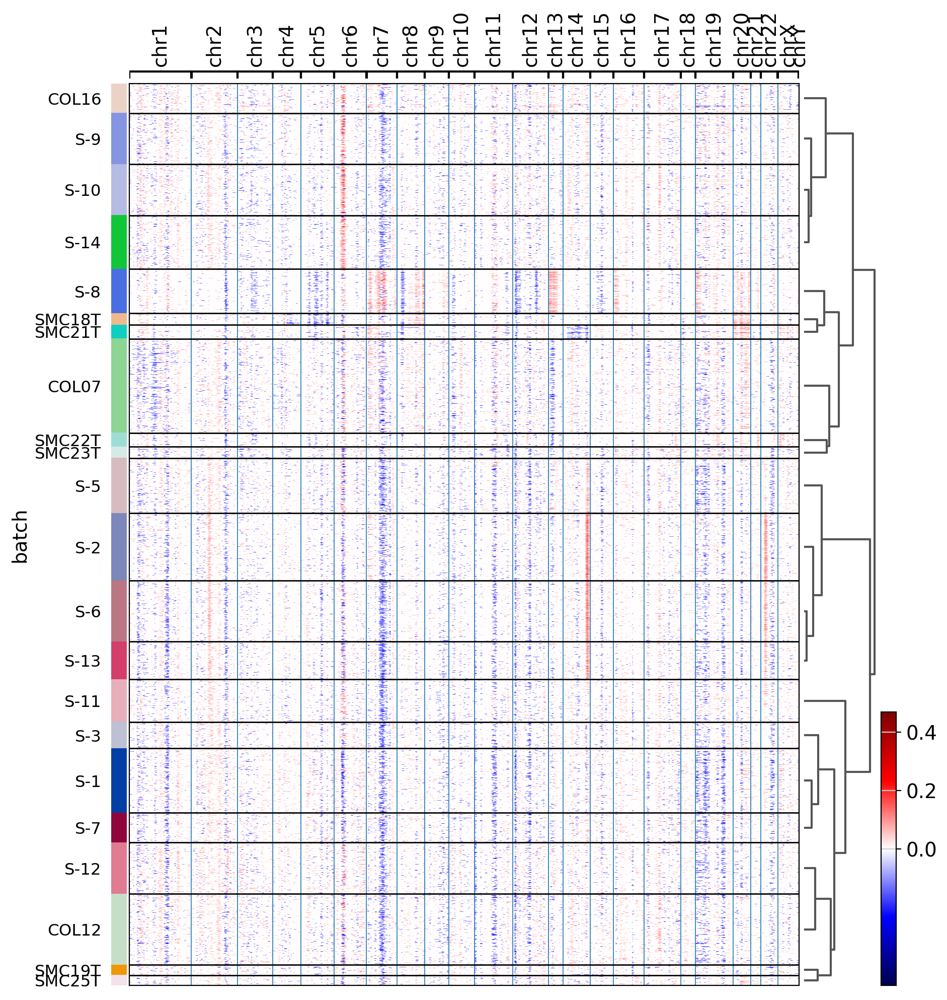

... storing 'Metastases' as categorical


         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:51)
Storing dendrogram info using `.uns['dendrogram_Metastases']`
categories: With Metastases, Without Metastases
var_group_labels: chr1, chr2, chr3, etc.


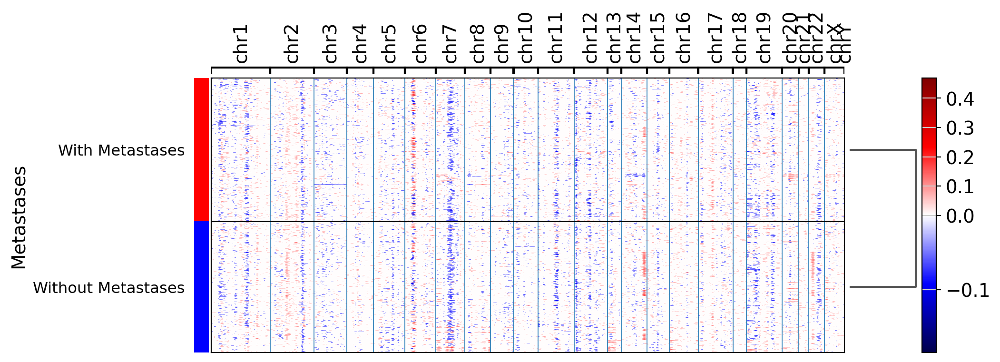

In [31]:
cnv.pl.chromosome_heatmap(adata, groupby="CellType", cmap='seismic', figsize=(10,6), save='1.svg', dendrogram=False)
cnv.pl.chromosome_heatmap(adata, groupby="batch", cmap='seismic', figsize=(10, 12), save='2.svg', dendrogram=True)
cnv.pl.chromosome_heatmap(adata, groupby="Metastases", cmap='seismic', figsize=(10, 4), save='3.svg', dendrogram=True)

In [ ]:
cnv.tl.pca(adata, svd_solver='arpack')
cnv.pp.neighbors(adata, n_neighbors=15, n_pcs=50, knn=True)
cnv.tl.leiden(adata, resolution=1)
cnv.tl.umap(adata)
cnv.tl.cnv_score(adata)
adata

In [ ]:
adata.obs.to_csv("YS_all_cell_CNV.csv")

In [34]:
cnv.tl.infercnv(adata, reference_key='CellType', reference_cat='Immune', window_size =250, step = 10, exclude_chromosomes={'chrMT'}, n_jobs=32)
adata

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [01:31<00:00,  2.69s/it]


AnnData object with n_obs × n_vars = 166180 × 36117
    obs: 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'Metastases', 'CellType', 'cnv_leiden', 'cnv_score'
    var: 'gene_ids', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'chromosome', 'start', 'end'
    uns: 'leiden_colors', 'Metastases_colors', 'batch_colors', 'log1p', 'cnv', 'CellType_colors', 'dendrogram_batch', 'dendrogram_Metastases', 'cnv_neighbors', 'leiden'
    obsm: 'X_umap', 'X_cnv', 'X_cnv_pca', 'X_cnv_umap'
    obsp: 'cnv_neighbors_distances', 'cnv_neighbors_connectivities'

... storing 'Metastases' as categorical


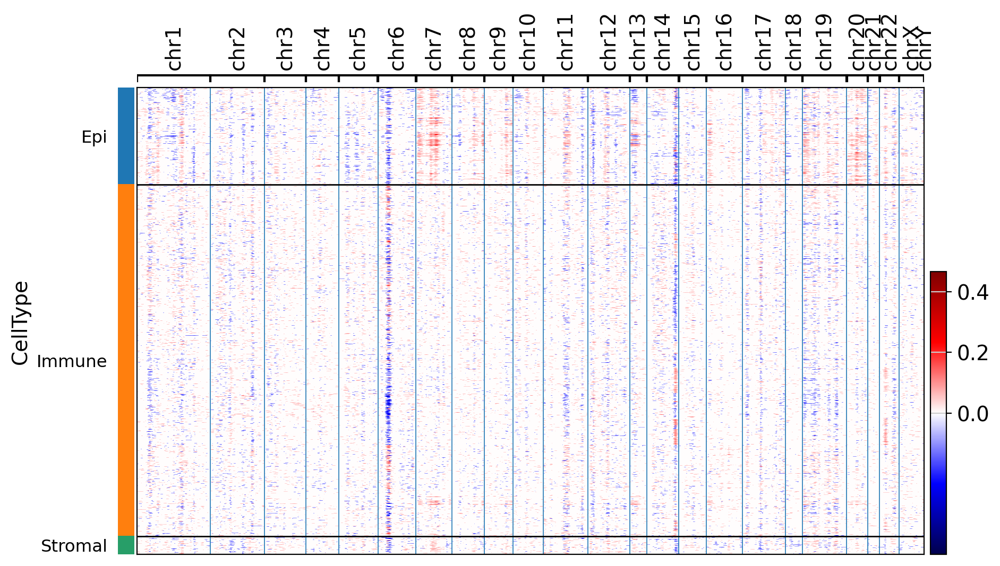

... storing 'Metastases' as categorical


categories: S-1, S-2, S-3, etc.
var_group_labels: chr1, chr2, chr3, etc.


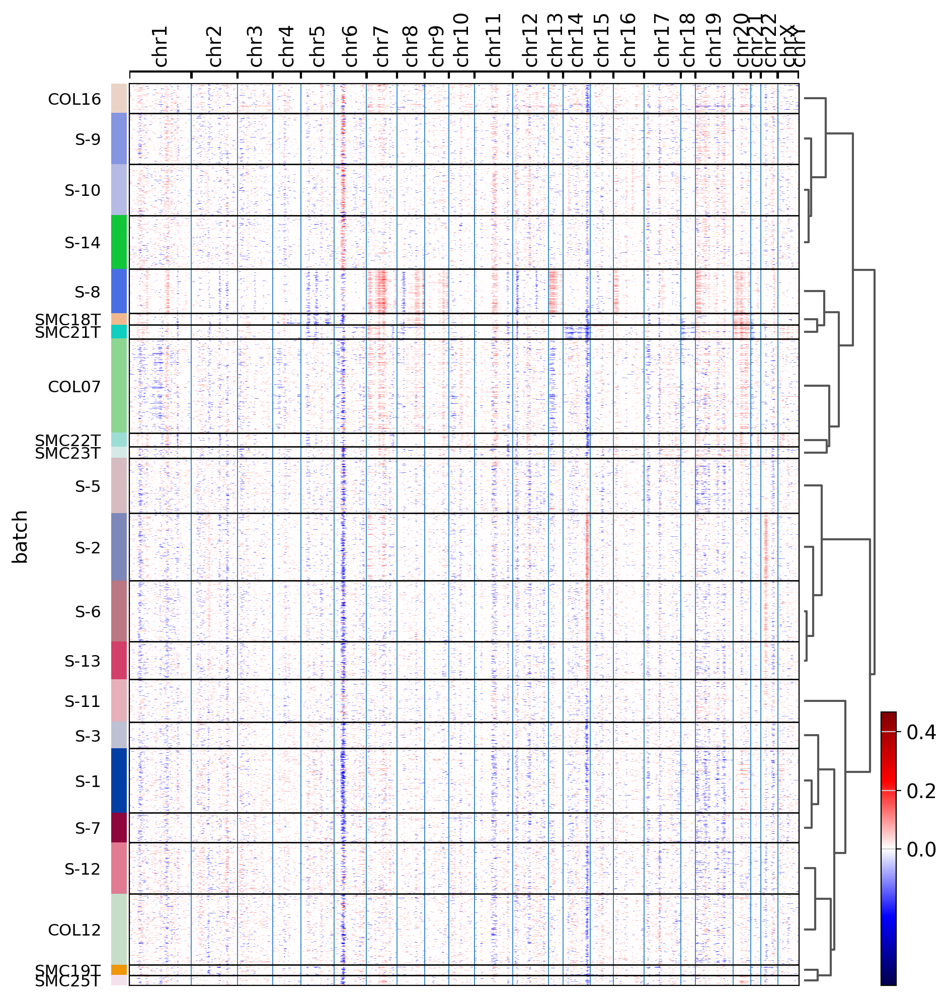

... storing 'Metastases' as categorical


categories: With Metastases, Without Metastases
var_group_labels: chr1, chr2, chr3, etc.


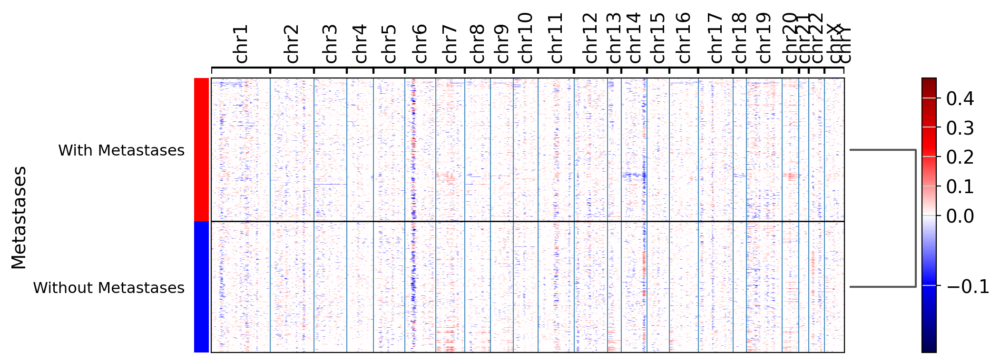

In [35]:
cnv.pl.chromosome_heatmap(adata, groupby="CellType", cmap='seismic', figsize=(10,6), save='immu_1.svg', dendrogram=False)
cnv.pl.chromosome_heatmap(adata, groupby="batch", cmap='seismic', figsize=(10, 12), save='immu_2.svg', dendrogram=True)
cnv.pl.chromosome_heatmap(adata, groupby="Metastases", cmap='seismic', figsize=(10, 4), save='immu_3.svg', dendrogram=True)

In [36]:
cnv.tl.pca(adata, svd_solver='arpack')
cnv.pp.neighbors(adata, n_neighbors=15, n_pcs=50, knn=True)
cnv.tl.leiden(adata, resolution=1)
cnv.tl.umap(adata)
cnv.tl.cnv_score(adata)
adata

computing PCA
    with n_comps=50
    finished (0:00:49)
computing neighbors
    finished: added to `.uns['cnv_neighbors']`
    `.obsp['cnv_neighbors_distances']`, distances for each pair of neighbors
    `.obsp['cnv_neighbors_connectivities']`, weighted adjacency matrix (0:00:26)
running Leiden clustering
    finished: found 21 clusters and added
    'cnv_leiden', the cluster labels (adata.obs, categorical) (0:06:37)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:48)


AnnData object with n_obs × n_vars = 166180 × 36117
    obs: 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'Metastases', 'CellType', 'cnv_leiden', 'cnv_score'
    var: 'gene_ids', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'chromosome', 'start', 'end'
    uns: 'leiden_colors', 'Metastases_colors', 'batch_colors', 'log1p', 'cnv', 'CellType_colors', 'dendrogram_batch', 'dendrogram_Metastases', 'cnv_neighbors', 'leiden'
    obsm: 'X_umap', 'X_cnv', 'X_cnv_pca', 'X_cnv_umap'
    obsp: 'cnv_neighbors_distances', 'cnv_neighbors_connectivities'

In [37]:
adata.obs.to_csv("YS_all_cell_CNV2.csv")

... storing 'Metastases' as categorical
... storing 'chromosome' as categorical
/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


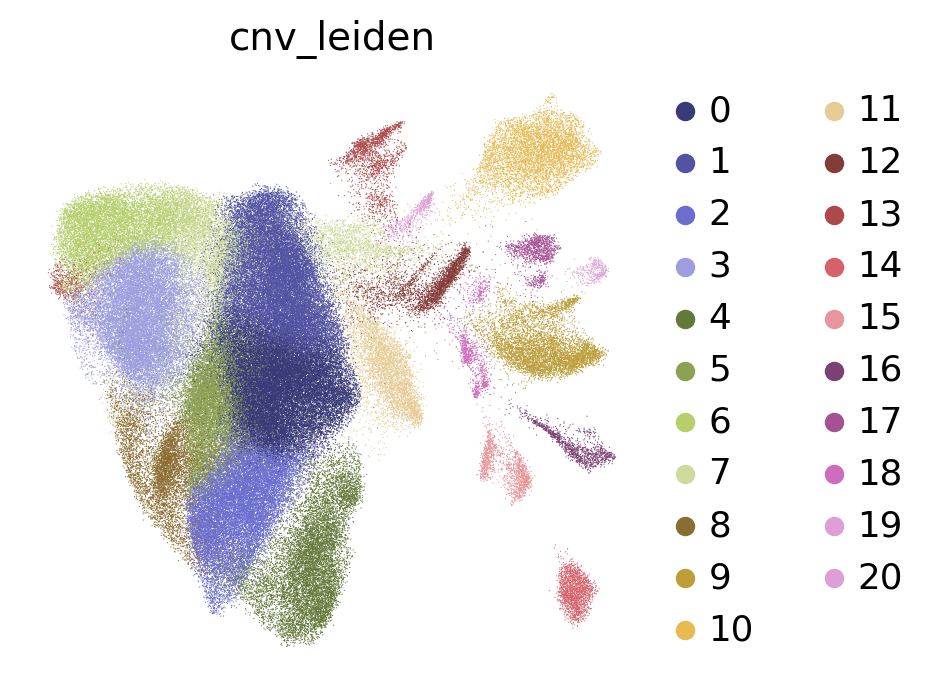

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


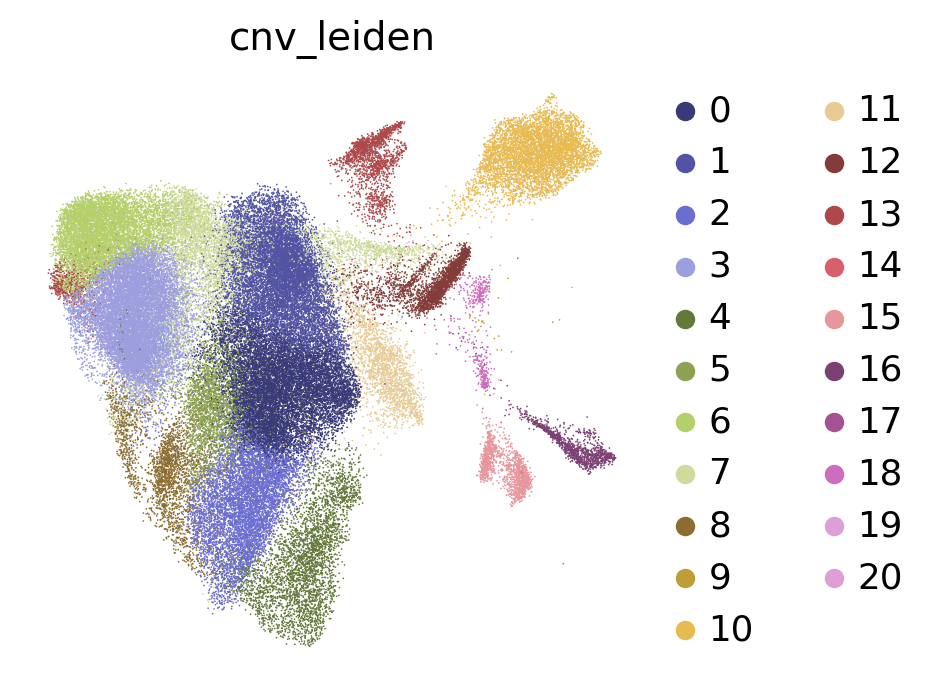

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


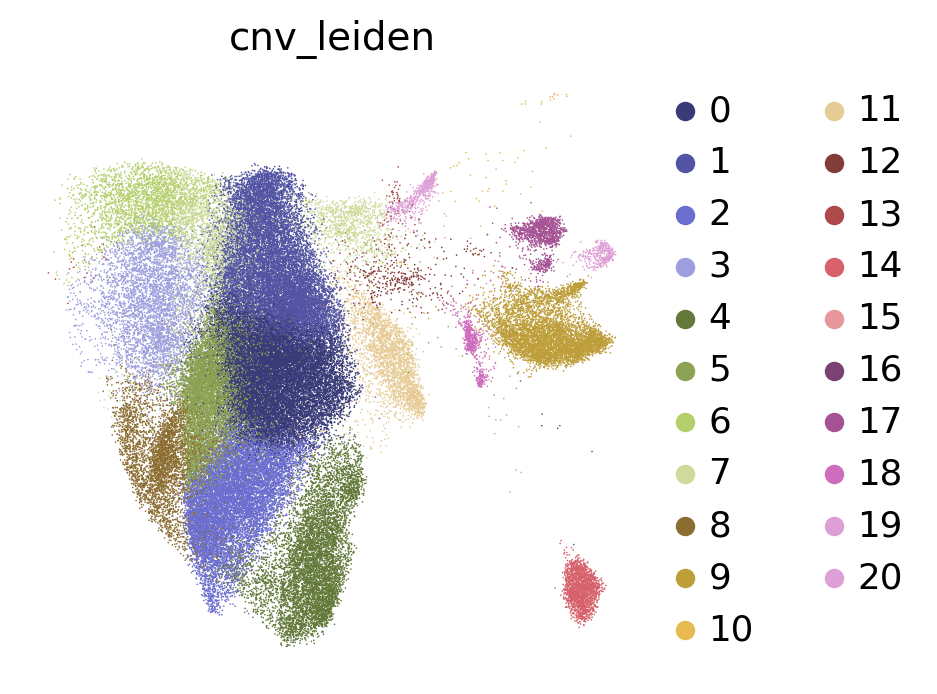

In [38]:
# reUMAP the cells based on 'cnv_leiden' calculated from cnv matrix
cnv.pl.umap(adata, color="cnv_leiden", use_raw=None, frameon=False, legend_loc='right margin', palette='tab20b')
cnv.pl.umap(adata[adata.obs['Metastases']=='Without Metastases'], color="cnv_leiden", use_raw=None, frameon=False, legend_loc='right margin')
cnv.pl.umap(adata[adata.obs['Metastases']=='With Metastases'], color="cnv_leiden", use_raw=None, frameon=False, legend_loc='right margin')

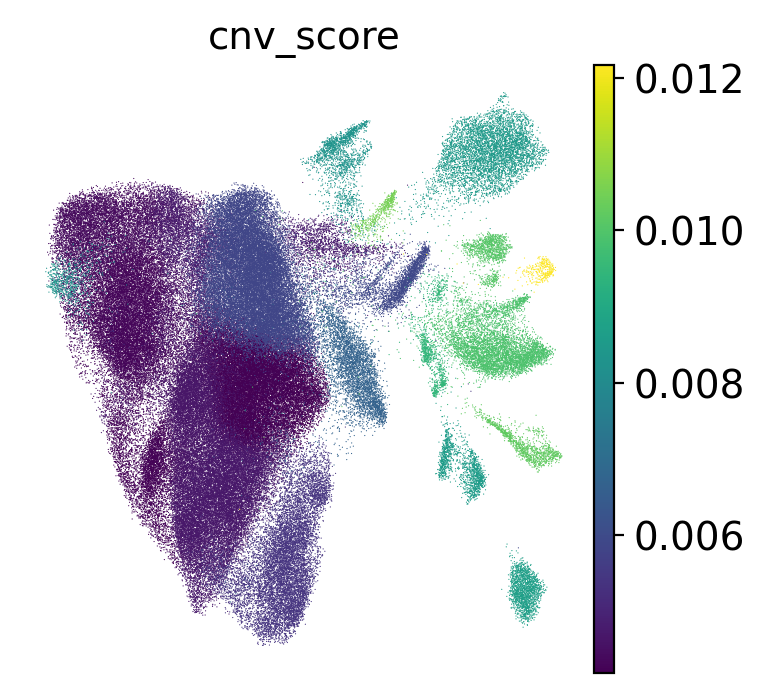

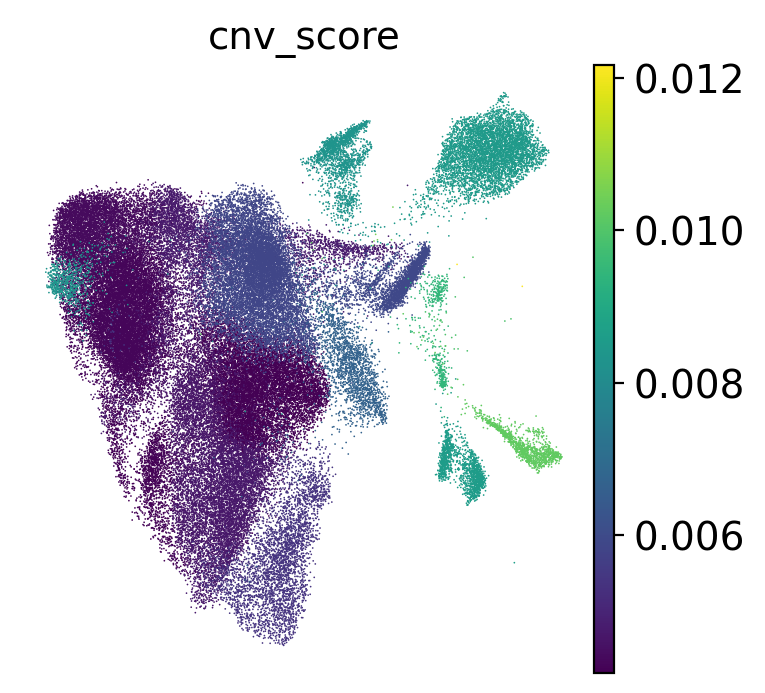

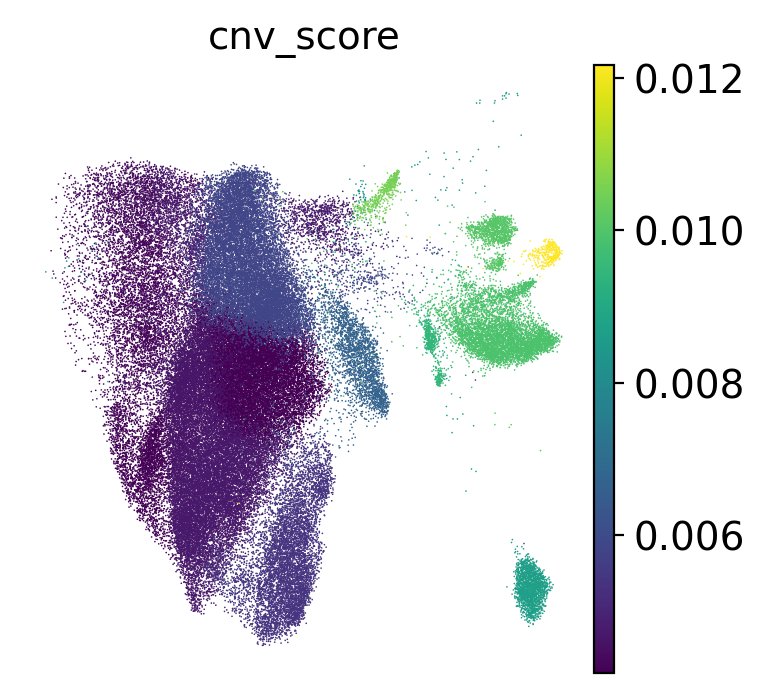

In [39]:
# show the cnv_score on UMAP, higher cnv_score, more cnv
cnv.pl.umap(adata, color="cnv_score", use_raw=None, frameon=False, legend_loc='right margin',save='all_CNVscore.pdf')
cnv.pl.umap(adata[adata.obs['Metastases']=='Without Metastases'], color="cnv_score", use_raw=None, frameon=False, legend_loc='right margin',save='TnM_CNVscore.pdf')
cnv.pl.umap(adata[adata.obs['Metastases']=='With Metastases'], color="cnv_score", use_raw=None, frameon=False, legend_loc='right margin',save='TM_CNVscore.pdf')

In [40]:
adata_epi=adata[adata.obs['CellType'].isin(['Epi'])]
adata_epi

View of AnnData object with n_obs × n_vars = 34495 × 36117
    obs: 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'Metastases', 'CellType', 'cnv_leiden', 'cnv_score'
    var: 'gene_ids', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'chromosome', 'start', 'end'
    uns: 'leiden_colors', 'Metastases_colors', 'batch_colors', 'log1p', 'cnv', 'CellType_colors', 'dendrogram_batch', 'dendrogram_Metastases', 'cnv_neighbors', 'leiden', 'cnv_leiden_colors'
    obsm: 'X_umap', 'X_cnv', 'X_cnv_pca', 'X_cnv_umap'
    obsp: 'cnv_neighbors_distances', 'cnv_neighbors_connectivities'

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


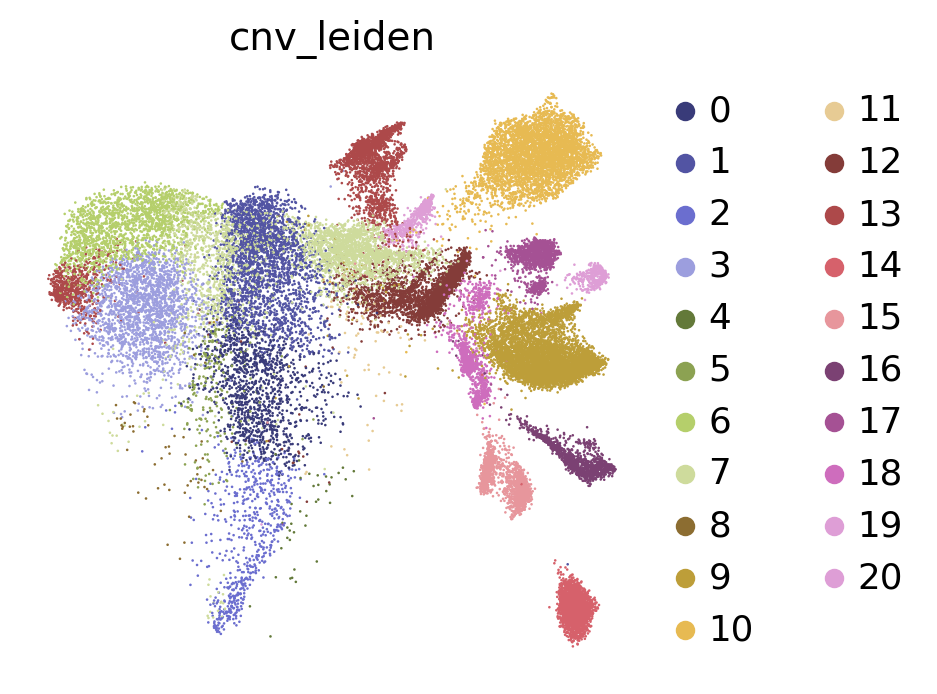

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


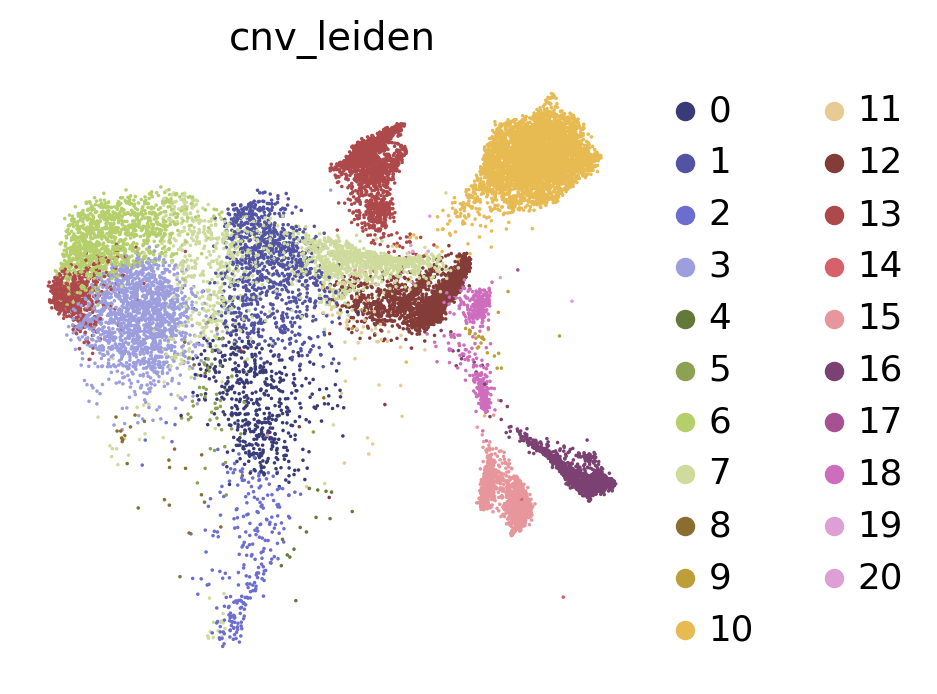

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


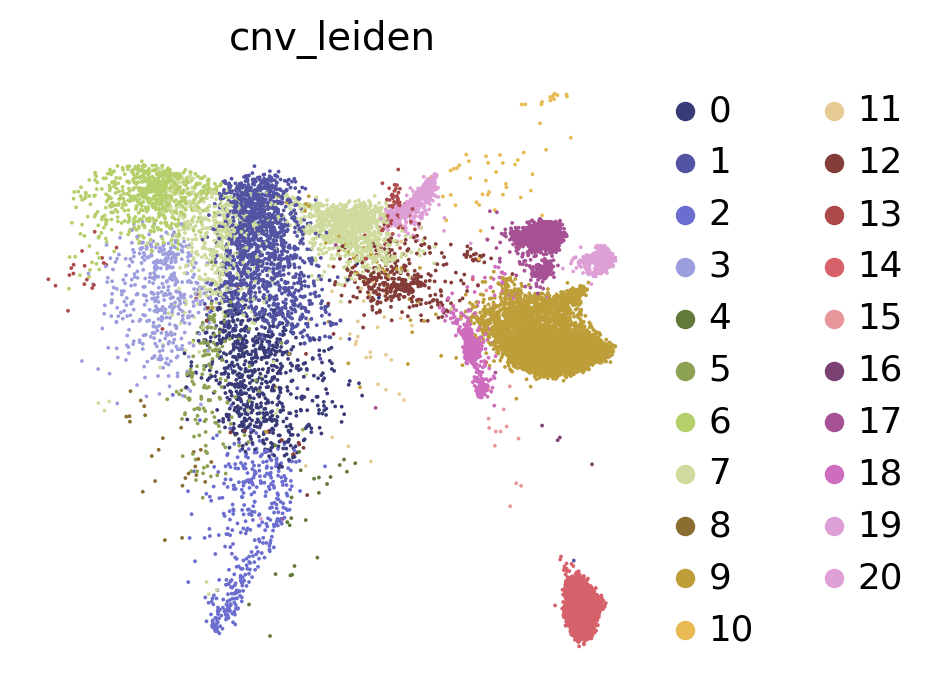

In [41]:
# reUMAP the cells based on 'cnv_leiden' calculated from cnv matrix
cnv.pl.umap(adata_epi, color="cnv_leiden", use_raw=None, frameon=False, legend_loc='right margin', palette='tab20b')
cnv.pl.umap(adata_epi[adata_epi.obs['Metastases']=='Without Metastases'], color="cnv_leiden", use_raw=None, frameon=False, legend_loc='right margin')
cnv.pl.umap(adata_epi[adata_epi.obs['Metastases']=='With Metastases'], color="cnv_leiden", use_raw=None, frameon=False, legend_loc='right margin')

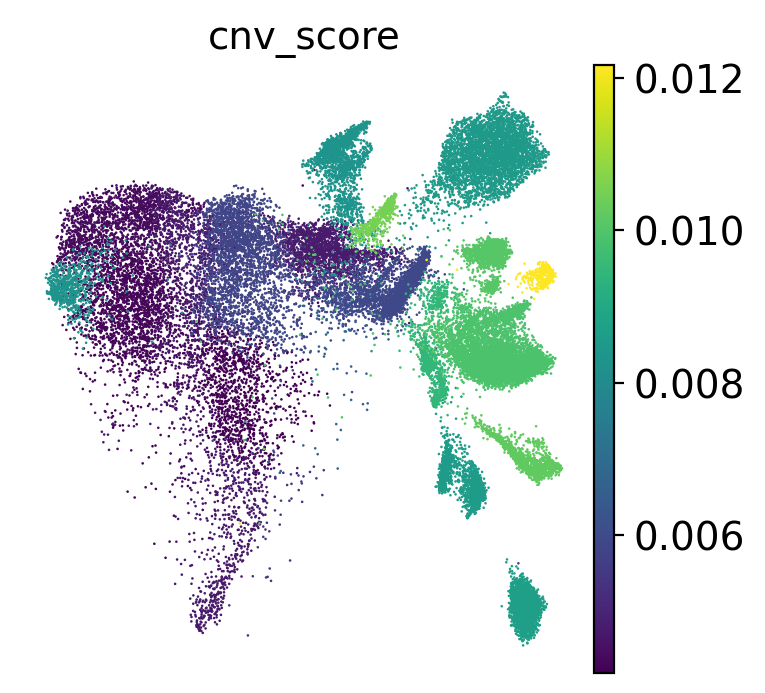

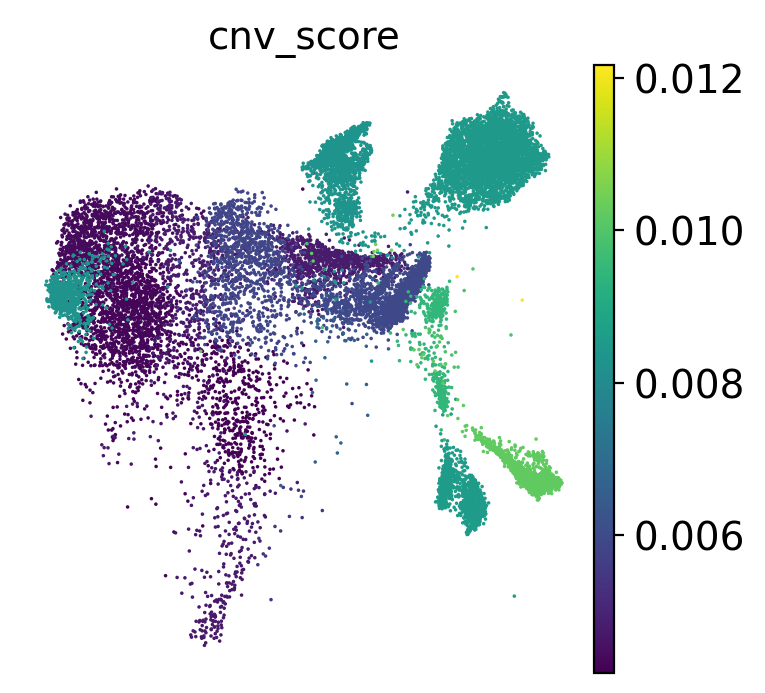

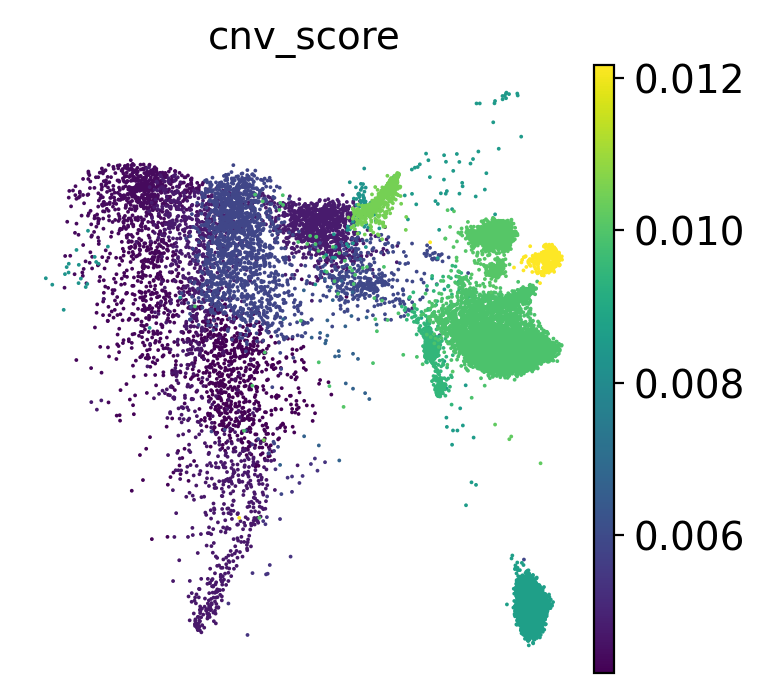

In [42]:
# show the cnv_score on UMAP, higher cnv_score, more cnv
cnv.pl.umap(adata_epi, color="cnv_score", use_raw=None, frameon=False, legend_loc='right margin',save='all_CNVscore.pdf')
cnv.pl.umap(adata_epi[adata_epi.obs['Metastases']=='Without Metastases'], color="cnv_score", use_raw=None, frameon=False, legend_loc='right margin',save='TnM_epi_CNVscore.pdf')
cnv.pl.umap(adata_epi[adata_epi.obs['Metastases']=='With Metastases'], color="cnv_score", use_raw=None, frameon=False, legend_loc='right margin',save='TM_epi_CNVscore.pdf')

In [7]:
adata_without_metastases = adata_epi[adata_epi.obs['Metastases'] == 'Without Metastases']
adata_with_metastases = adata_epi[adata_epi.obs['Metastases'] == 'With Metastases']

In [8]:
adata_without_metastases

View of AnnData object with n_obs × n_vars = 18389 × 36117
    obs: 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'Metastases', 'CellType', 'cnv_leiden', 'cnv_score', 'CNV_Label', 'cnv_status'
    var: 'gene_ids', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'chromosome', 'start', 'end'
    uns: 'CellType_colors', 'Metastases_colors', 'batch_colors', 'cnv', 'cnv_leiden_colors', 'cnv_neighbors', 'cnv_status_colors', 'dendrogram_Metastases', 'dendrogram_batch', 'leiden', 'leiden_colors', 'log1p'
    obsm: 'X_cnv', 'X_cnv_pca', 'X_cnv_umap', 'X_umap'
    obsp: 'cnv_neighbors_connectivities', 'cnv_neighbors_distances'

In [9]:
adata_with_metastases

View of AnnData object with n_obs × n_vars = 16106 × 36117
    obs: 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'Metastases', 'CellType', 'cnv_leiden', 'cnv_score', 'CNV_Label', 'cnv_status'
    var: 'gene_ids', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'chromosome', 'start', 'end'
    uns: 'CellType_colors', 'Metastases_colors', 'batch_colors', 'cnv', 'cnv_leiden_colors', 'cnv_neighbors', 'cnv_status_colors', 'dendrogram_Metastases', 'dendrogram_batch', 'leiden', 'leiden_colors', 'log1p'
    obsm: 'X_cnv', 'X_cnv_pca', 'X_cnv_umap', 'X_umap'
    obsp: 'cnv_neighbors_connectivities', 'cnv_neighbors_distances'

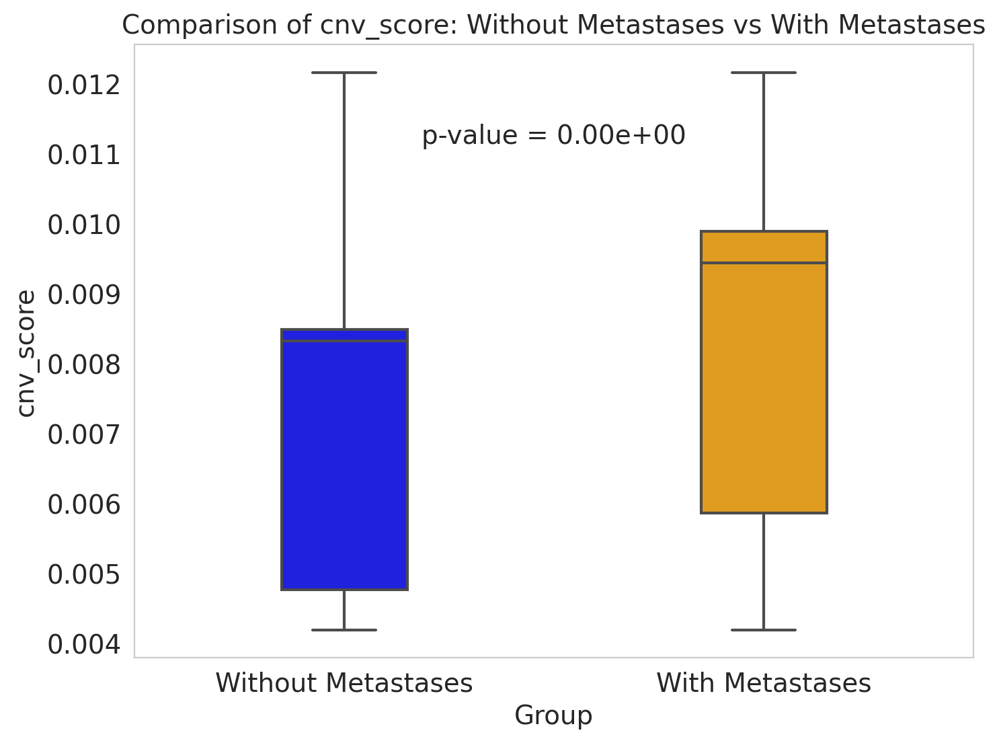

In [11]:
import pandas as pd
import seaborn as sns
import scipy.stats as stats
import matplotlib.pyplot as plt

# 首先，我们需要从AnnData对象中提取数据
adata_without_metastases_df = adata_without_metastases.obs[['cnv_score']].copy()
adata_without_metastases_df['Group'] = 'Without Metastases'

adata_with_metastases_df = adata_with_metastases.obs[['cnv_score']].copy()
adata_with_metastases_df['Group'] = 'With Metastases'

# 合并这两个数据集
df = pd.concat([adata_without_metastases_df, adata_with_metastases_df])

# 你可以使用Mann-Whitney U测试来比较两个独立的非正态分布
u_statistic, p_value = stats.mannwhitneyu(adata_without_metastases_df['cnv_score'], adata_with_metastases_df['cnv_score'])

sns.set_style("whitegrid", {'axes.grid' : False})
plt.figure(figsize=(8, 6))

# 使用seaborn库进行箱线图绘制
box_plot = sns.boxplot(x='Group', y='cnv_score', data=df, palette=['blue', 'orange'], width=0.3)

# 在箱线图上方标出p值
plt.text(0.5, 0.85, 'p-value = {:.2e}'.format(p_value), horizontalalignment='center', verticalalignment='center', transform=box_plot.transAxes)
plt.title('Comparison of cnv_score: Without Metastases vs With Metastases')
plt.savefig("TMvsTnM_epi_cnvscore_boxplot_allcells.pdf",dpi=600,bbox_inches='tight')
plt.show()


In [48]:
adata_epi.obs['batch']

AAACCTGAGCCGTCGT-1-S-1          S-1
AAACCTGAGGGTGTTG-1-S-1          S-1
AAACCTGAGTGGGTTG-1-S-1          S-1
AAACCTGCATAGTAAG-1-S-1          S-1
AAACCTGGTACCCAAT-1-S-1          S-1
                              ...  
TTTGCGCCATGTTCCC-1-SMC25T    SMC25T
TTTGGTTGTACTCGCG-1-SMC25T    SMC25T
TTTGGTTGTAGGGTAC-1-SMC25T    SMC25T
TTTGTCAAGAGGGATA-1-SMC25T    SMC25T
TTTGTCATCCCAAGTA-1-SMC25T    SMC25T
Name: batch, Length: 34495, dtype: category
Categories (22, object): ['S-1', 'S-2', 'S-3', 'S-5', ..., 'SMC21T', 'SMC22T', 'SMC23T', 'SMC25T']

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


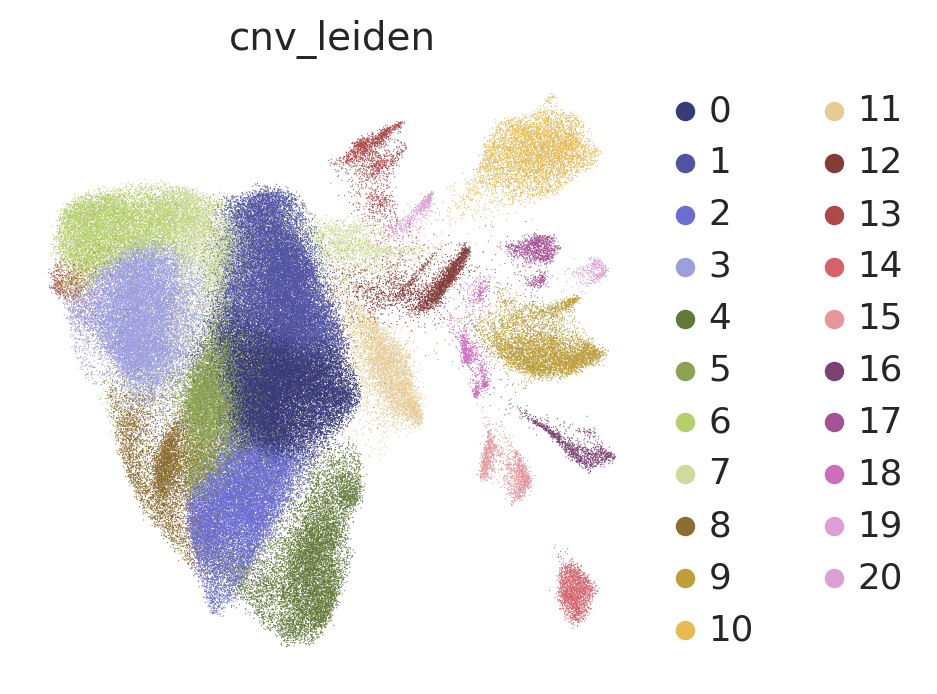

In [64]:
# reUMAP the cells based on 'cnv_leiden' calculated from cnv matrix
cnv.pl.umap(adata, color="cnv_leiden", use_raw=None, frameon=False, legend_loc='right margin', palette='tab20b',save='CNVleiden_all.pdf')

In [66]:
adata

AnnData object with n_obs × n_vars = 166180 × 36117
    obs: 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'Metastases', 'CellType', 'cnv_leiden', 'cnv_score'
    var: 'gene_ids', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'chromosome', 'start', 'end'
    uns: 'leiden_colors', 'Metastases_colors', 'batch_colors', 'log1p', 'cnv', 'CellType_colors', 'dendrogram_batch', 'dendrogram_Metastases', 'cnv_neighbors', 'leiden', 'cnv_leiden_colors'
    obsm: 'X_umap', 'X_cnv', 'X_cnv_pca', 'X_cnv_umap'
    obsp: 'cnv_neighbors_distances', 'cnv_neighbors_connectivities'

In [69]:
import numpy as np
from scipy.stats import mannwhitneyu

# 计算 `adata.obs['CellType']` 中类型为 'Immune' 的 `cnv_score` 的平均值
immune_mean = adata.obs.loc[adata.obs['CellType'] == 'Immune', 'cnv_score'].mean()

# 初始化一个新的列来存储结果
adata.obs['cnv_status'] = 'CNV_Non_malignant'

# 对于 `adata.obs` 中的每个 `cnv_leiden` 类别，计算 `cnv_score` 的平均值，并与 'Immune' 的平均值进行比较
for cnv_leiden in adata.obs['cnv_leiden'].unique():
    cnv_leiden_mean = adata.obs.loc[adata.obs['cnv_leiden'] == cnv_leiden, 'cnv_score'].mean()
    # 使用 Mann-Whitney U 测试进行比较
    _, p_value = mannwhitneyu(adata.obs.loc[adata.obs['CellType'] == 'Immune', 'cnv_score'],
                              adata.obs.loc[adata.obs['cnv_leiden'] == cnv_leiden, 'cnv_score'],
                              alternative='two-sided')
    # 如果 p 值小于 0.05 且 cnv_leiden 平均值大于 'Immune' 的平均值，将该类别标记为 'CNV_Malignant'
    if p_value < 0.05 and cnv_leiden_mean > immune_mean:
        adata.obs.loc[adata.obs['cnv_leiden'] == cnv_leiden, 'cnv_status'] = 'CNV_Malignant'


In [68]:
adata

AnnData object with n_obs × n_vars = 166180 × 36117
    obs: 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'Metastases', 'CellType', 'cnv_leiden', 'cnv_score', 'CNV_Label'
    var: 'gene_ids', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'chromosome', 'start', 'end'
    uns: 'leiden_colors', 'Metastases_colors', 'batch_colors', 'log1p', 'cnv', 'CellType_colors', 'dendrogram_batch', 'dendrogram_Metastases', 'cnv_neighbors', 'leiden', 'cnv_leiden_colors'
    obsm: 'X_umap', 'X_cnv', 'X_cnv_pca', 'X_cnv_umap'
    obsp: 'cnv_neighbors_distances', 'cnv_neighbors_connectivities'

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


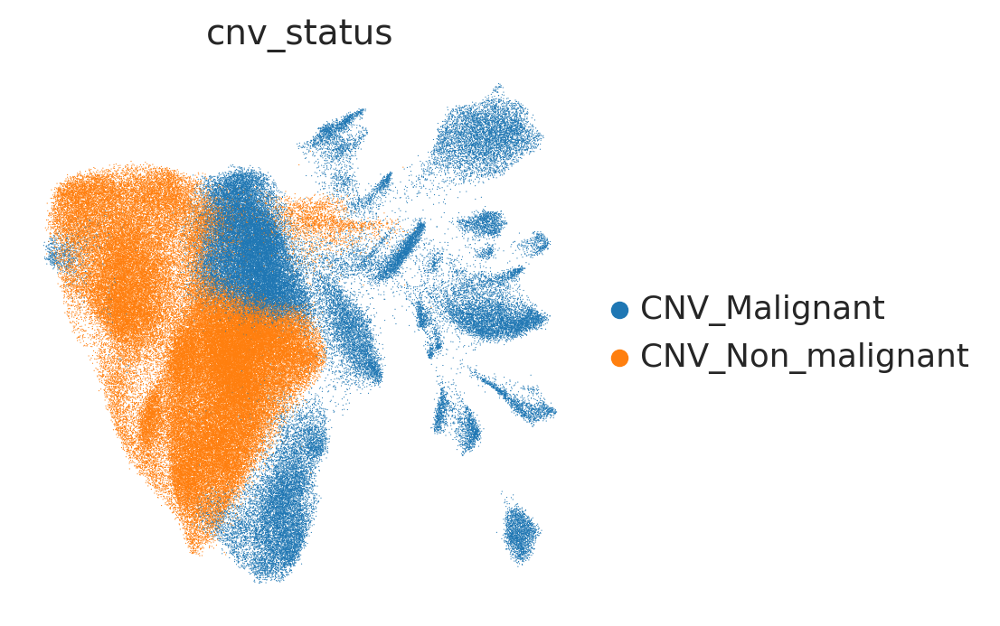

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


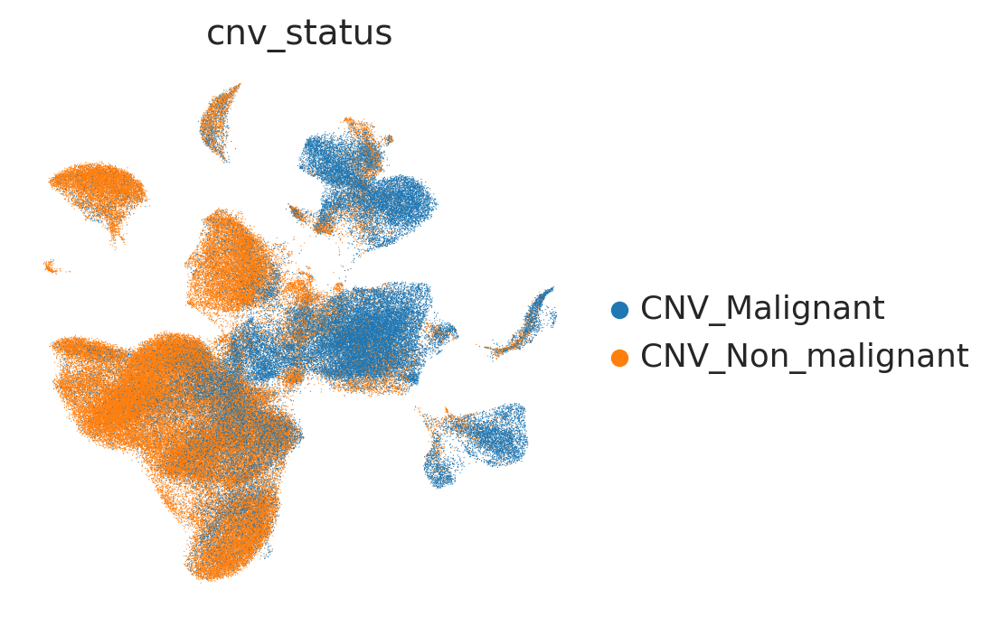

In [74]:
cnv.pl.umap(adata, color="cnv_status", use_raw=False, frameon=False, legend_loc='right margin',save='CNV_status_all_cells')
sc.pl.umap(adata, color="cnv_status", use_raw=False, frameon=False, legend_loc='right margin',save='CNV_status_all_cells')

In [71]:
adata_epi=adata[adata.obs['CellType'].isin(['Epi'])]
adata_epi

View of AnnData object with n_obs × n_vars = 34495 × 36117
    obs: 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'Metastases', 'CellType', 'cnv_leiden', 'cnv_score', 'CNV_Label', 'cnv_status'
    var: 'gene_ids', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'chromosome', 'start', 'end'
    uns: 'leiden_colors', 'Metastases_colors', 'batch_colors', 'log1p', 'cnv', 'CellType_colors', 'dendrogram_batch', 'dendrogram_Metastases', 'cnv_neighbors', 'leiden', 'cnv_leiden_colors', 'cnv_status_colors'
    obsm: 'X_umap', 'X_cnv', 'X_cnv_pca', 'X_cnv_umap'
    obsp: 'cnv_neighbors_distances', 'cnv_neighbors_connectivities'

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


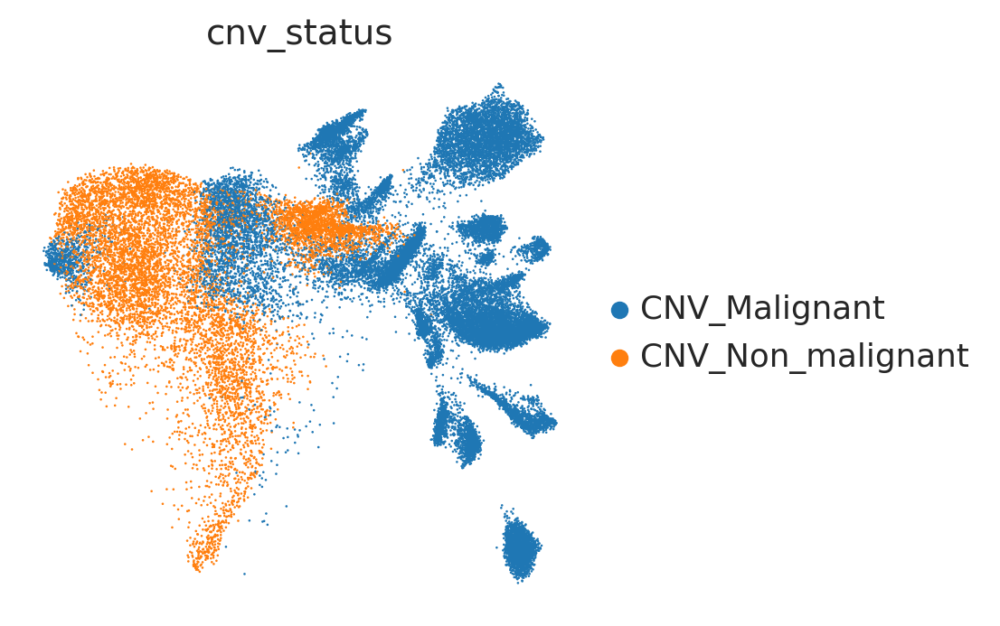

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


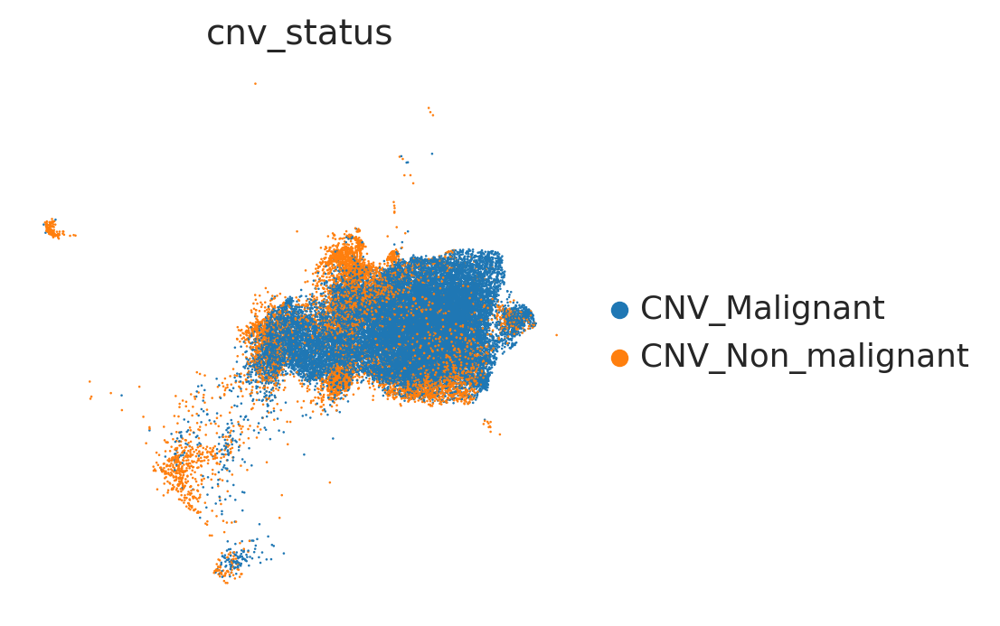

In [75]:
cnv.pl.umap(adata_epi, color="cnv_status", use_raw=False, frameon=False, legend_loc='right margin',save='CNV_status_epi_cells')
sc.pl.umap(adata_epi, color="cnv_status", use_raw=False, frameon=False, legend_loc='right margin',save='CNV_status_epi_cells')

         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:50)
Storing dendrogram info using `.uns['dendrogram_cnv_status']`
categories: CNV_Malignant, CNV_Non_malignant
var_group_labels: chr1, chr2, chr3, etc.


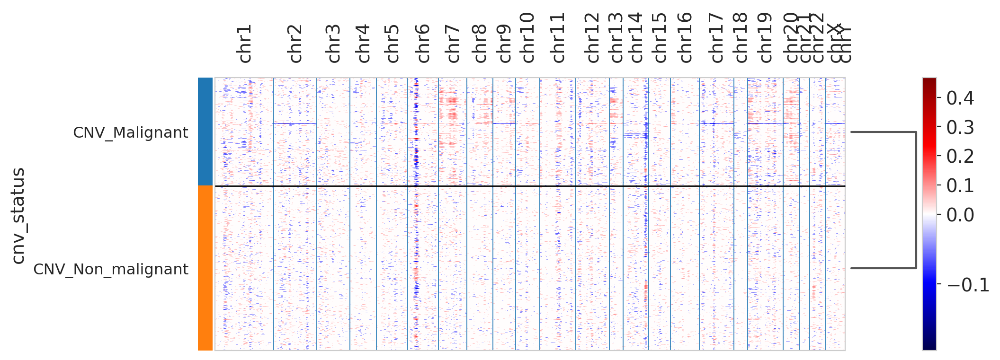

In [76]:
cnv.pl.chromosome_heatmap(adata, groupby="cnv_status", cmap='seismic', figsize=(10, 4), save='immnue_cnv_status.svg', dendrogram=True)

         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:26)
Storing dendrogram info using `.uns['dendrogram_cnv_status']`
categories: CNV_Malignant, CNV_Non_malignant
var_group_labels: chr1, chr2, chr3, etc.


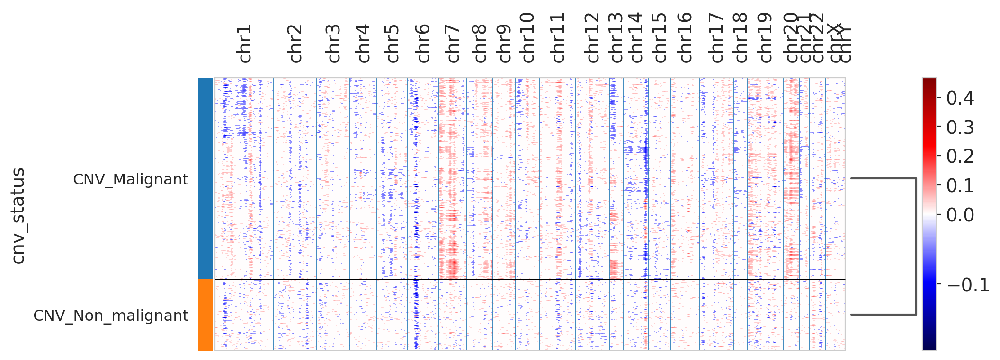

In [77]:
cnv.pl.chromosome_heatmap(adata_epi, groupby="cnv_status", cmap='seismic', figsize=(10, 4), save='immnue_cnv_status_epi.svg', dendrogram=True)

In [78]:
adata.write('YS_cnv_adata_after_cnv_status.h5ad',compression='gzip')

In [79]:
adata_epi.write('YS_cnv_adata_epi_after_cnv_status.h5ad',compression='gzip')

In [5]:
adata_epi=sc.read('YS_cnv_adata_epi_after_cnv_status.h5ad')

In [81]:
adata_epi.obs['cnv_status'].value_counts()

cnv_status
CNV_Malignant        25440
CNV_Non_malignant     9055
Name: count, dtype: int64

In [82]:
adata_epi

View of AnnData object with n_obs × n_vars = 34495 × 36117
    obs: 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'Metastases', 'CellType', 'cnv_leiden', 'cnv_score', 'CNV_Label', 'cnv_status'
    var: 'gene_ids', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'chromosome', 'start', 'end'
    uns: 'leiden_colors', 'Metastases_colors', 'batch_colors', 'log1p', 'cnv', 'CellType_colors', 'dendrogram_batch', 'dendrogram_Metastases', 'cnv_neighbors', 'leiden', 'cnv_leiden_colors', 'cnv_status_colors'
    obsm: 'X_umap', 'X_cnv', 'X_cnv_pca', 'X_cnv_umap'
    obsp: 'cnv_neighbors_distances', 'cnv_neighbors_connectivities'

In [84]:
adata_epi.obs.to_csv("adata_epi_obs_infor.csv")

In [6]:
adata_mal=adata_epi[adata_epi.obs['cnv_status'].isin(['CNV_Malignant'])]
adata_mal

View of AnnData object with n_obs × n_vars = 25440 × 36117
    obs: 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'Metastases', 'CellType', 'cnv_leiden', 'cnv_score', 'CNV_Label', 'cnv_status'
    var: 'gene_ids', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'chromosome', 'start', 'end'
    uns: 'CellType_colors', 'Metastases_colors', 'batch_colors', 'cnv', 'cnv_leiden_colors', 'cnv_neighbors', 'cnv_status_colors', 'dendrogram_Metastases', 'dendrogram_batch', 'leiden', 'leiden_colors', 'log1p'
    obsm: 'X_cnv', 'X_cnv_pca', 'X_cnv_umap', 'X_umap'
    obsp: 'cnv_neighbors_connectivities', 'cnv_neighbors_distances'

In [5]:
import scanpy as sc

# Extract the indices of the cells in the raw AnnData object
cell_indices = adata_mal.obs_names

# Subset the raw AnnData object using the extracted cell indices
adata = raw[cell_indices]

# Print the information of the new AnnData object
print(adata)

View of AnnData object with n_obs × n_vars = 25440 × 36601
    obs: 'predicted_doublets', 'batch'
    var: 'gene_ids'


In [6]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)


/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)


In [9]:
adata.to_df().reset_index().to_csv("adata_epi_mal_normalized_data.csv", index=False)

In [8]:
import numpy as np

# 打印最小值
print(np.amin(adata.X))

# 打印最大值
print(np.amax(adata.X))


0.0
8.83195


In [9]:
sc.pp.scale(adata, zero_center=False)

In [10]:
import numpy as np

# 打印最小值
print(np.amin(adata.X))

# 打印最大值
print(np.amax(adata.X))

0.0
159.49922


In [14]:
sc.pp.scale(adata)
print(np.amin(adata.X))
print(np.amax(adata.X))       

-7.683445
159.49284


In [12]:
adata = raw[cell_indices]
adata.var['mt'] = adata.var_names.str.startswith('MT-')
adata.var['rp'] = adata.var_names.str.startswith('RPL') | adata.var_names.str.startswith('RPS')
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt','rp'], percent_top=None, log1p=False, inplace=True)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.regress_out(adata, keys=['total_counts', 'pct_counts_mt','pct_counts_rp'], n_jobs=16)
# 打印最小值
print(np.amin(adata.X))

# 打印最大值
print(np.amax(adata.X))


/tmp/ipykernel_1600/1664701756.py:2: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['mt'] = adata.var_names.str.startswith('MT-')


normalizing counts per cell
    finished (0:00:00)
regressing out ['total_counts', 'pct_counts_mt', 'pct_counts_rp']
    sparse input is densified and may lead to high memory use
    finished (0:02:50)
-6.3948655
8.511569


In [15]:
adata = raw[cell_indices]
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.scale(adata)
print(np.amin(adata.X))
print(np.amax(adata.X))     

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
-5.2857127
159.49297


In [6]:
adata = raw[cell_indices]
adata.var['mt'] = adata.var_names.str.startswith('MT-')
adata.var['rp'] = adata.var_names.str.startswith('RPL') | adata.var_names.str.startswith('RPS')
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt','rp'], percent_top=None, log1p=False, inplace=True)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.regress_out(adata, keys=['total_counts', 'pct_counts_mt','pct_counts_rp'], n_jobs=16)
sc.pp.scale(adata,zero_center=False)
print(np.amin(adata.X))
print(np.amax(adata.X)) 

/tmp/ipykernel_3273/567014655.py:2: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['mt'] = adata.var_names.str.startswith('MT-')


normalizing counts per cell
    finished (0:00:00)
regressing out ['total_counts', 'pct_counts_mt', 'pct_counts_rp']
    sparse input is densified and may lead to high memory use
    finished (0:02:00)
-7.683445
159.49284


In [7]:
adata.to_df().reset_index().to_csv("adata_epi_mal_regressed_scaled_nocentered_data.csv", index=False)